## 1 - Principais bibliotecas que utilizaremos

Nesta prática vamos utilizar as seguintes bibliotecas, que serão úteis durante o curso:

*   **Scikit-Image** ([`https://scikit-image.org/`](https://scikit-image.org/)): Processamento de imagens

*   **Scikit-Learn** ([`https://scikit-learn.org/`](https://scikit-learn.org/)): Machine Learning (possui algumas funções úteis para processamento de imagens)

*   **Matplotlib** ([`https://matplotlib.org/`](https://matplotlib.org/)): Gráficos

*   **Scipy** ([`https://www.scipy.org/`](https://www.scipy.org/)): É o pacote principal de rotinas científicas em Python

*   **Numpy** [`https://numpy.org/`](https://numpy.org/)): Análise numérica. É a principal biblioteca do Scipy

In [93]:
from skimage import io # leitura e escrita de imagens
from skimage import data # banco de imagens
from skimage import exposure # manipulação de contraste
from skimage import util # utilidades 
from skimage import filters # filtros
from skimage import color # conversão de cores
from skimage.color import rgb2gray
from scipy import ndimage # contém a operação de convolução (convolve) para a aplicação de filtros digitais
import matplotlib.pyplot as plt # visualização das imagens e histogramas
import numpy as np # operações matemáticas e matriciais
from skimage.morphology import disk

## 2 (Opcional) Preparando o Drive para Leitura e Escrita de Dados

Executar o código apenas se estiver usando o Google Colab.

In [94]:
# from google.colab import drive

# Montando o drive para leitura e escrita. Escolha a conta que você deseja utilizar
# drive.mount('/content/drive', force_remount=True)

## 3 - Importando e Visualizando uma Imagem

Antes de importar uma imagem própria, vamos visualizar uma imagem do banco de dados próprio do Scikit-Image, através do módulo `data`. 

**Exercício:** 

Importar a imagem rocket do banco do skimage.data e exibir 6 cópias dela num mosaico 2x3

In [95]:
# Importar a imagem "rocket" do módulo data e salvar na variável rocket
rocket = data.rocket()

# Visuzalizar o número de pixels e canais da imagem
print(type(rocket))
print(rocket.shape)

<class 'numpy.ndarray'>
(427, 640, 3)


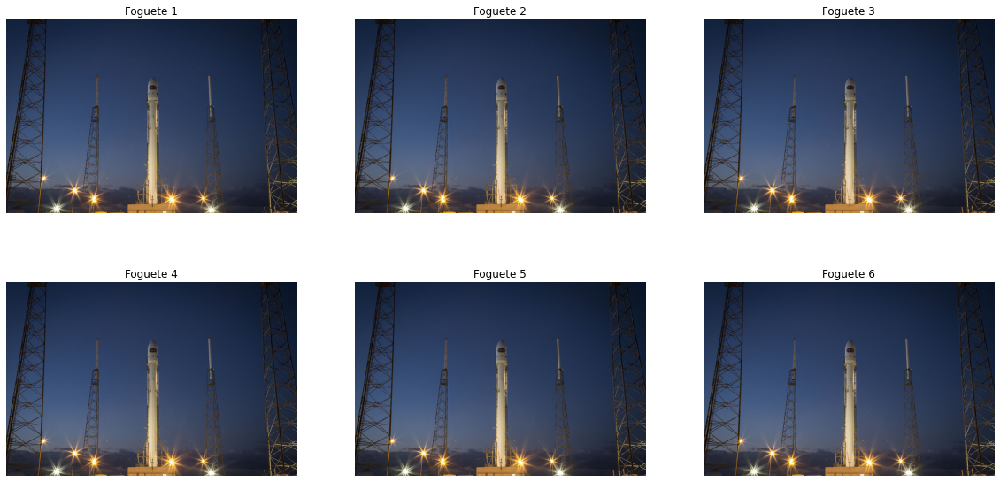

In [96]:
# Visualizar a imagem importada usando o pyplot
plt.figure(figsize=(20,10))
for i in range(1,7):  
  plt.subplot(2,3,i)
  plt.imshow(rocket)
  plt.axis('off')
  plt.title(f'Foguete {i}')

plt.show()

**Exercício:**

**(a)** Importar a imagem `Rio.jpg` que está no repositório `https://github.com/m2m2020/cg_uerj.git` para o drive

In [97]:
# Ler a imagem Images/Rio.jpg
rio = io.imread('data/images/rio.jpg')

**(b)** Visualizá-la usando o `pyplot`

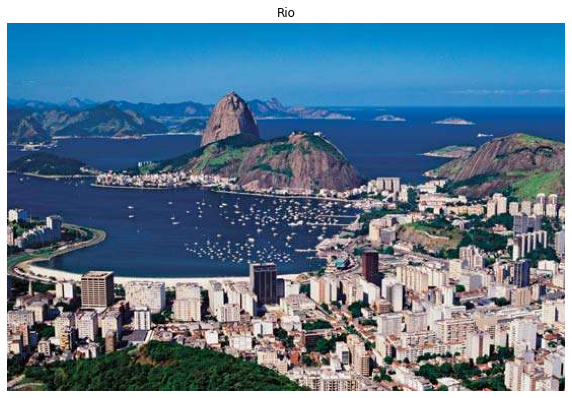

In [98]:
# Visualizar a imagem usando o pyplot
plt.figure(figsize=(10,10))
plt.imshow(rio)
plt.axis('off')
plt.title('Rio')
plt.show()

**(c)** Exibir o tipo da variável gerada após a importação da imagem

In [99]:
# Escreve o tipo da variável
print(type(rio))
print(type(rio[0][0][0]))
print(rio[0][0][0])
print(rio[0][0][1])
print(rio[0][0][2])

<class 'numpy.ndarray'>
<class 'numpy.uint8'>
5
118
188


**(d)** Exibir as dimensões da imagem

In [100]:
# Escreve as dimensões da variável
print(rio.shape)

(363, 550, 3)


**(e)** Gerar a imagem e escala de cinza

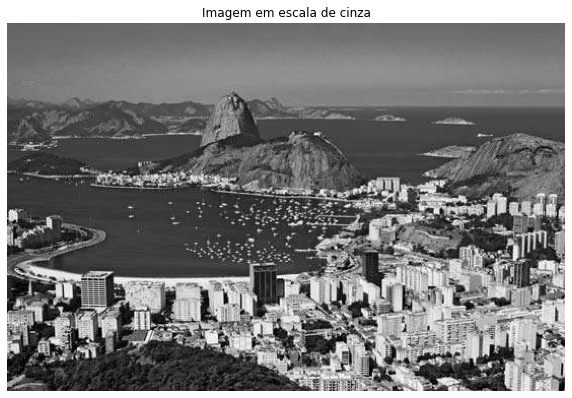

In [101]:
# Gerando a imagem em escala de cinza
rio_gray = rgb2gray(rio) # Cria imagem com apenas um canal, monocromática

# Exibindo a imagem
plt.figure(figsize = (10,10))
plt.title('Imagem em escala de cinza')

# Não imprime em cinza, pyplot define uma cor padrão baseada no seu mapa de cor
# plt.imshow(rio_gray) 

# Para imprimir em tons de cinze, defina o mapa de cor como "gray"
plt.imshow(rio_gray, cmap = 'gray')

plt.axis('off')
plt.show()

## 4 - Canais da Imagem

As imagens no sistema de cores RGB são formadas por 3 canais (R: Vermelho, G: Verde e B: Azul). Podemos estar interessados em conhecer as intensidades de cada canal em cada pixel da imagem. Nesta seção vamos analisar cada canal da imagem importada separadamente.

**Exercício:**

**(a)** Visualizar a imagem formada por cada canal separadamente em escala de cinza. Apresente as imagens usando 3 subplots em formato 1x3.

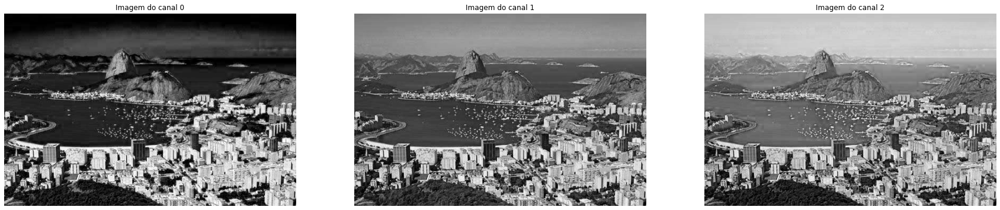

In [102]:
# Criando matrizes com cada canal da imagem (criando imagens monocromáticas)
img_ch0 = rio[:,:,0] # Matriz do vermelho R (primeiro canal)
img_ch1 = rio[:,:,1] # Matriz do verde G (segundo canal)
img_ch2 = rio[:,:,2] # Matriz do azul R (terceiro canal)

# Plotando as imagens de cada canal em escala de cinza
plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.imshow(img_ch0, cmap = 'gray'), plt.title('Imagem do canal 0'), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(img_ch1, cmap = 'gray'), plt.title('Imagem do canal 1'), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(img_ch2, cmap = 'gray'), plt.title('Imagem do canal 2'), plt.axis('off')
plt.show()

**(b)** Reconstrua a imagem das seguintes formas: 


*   Empilhando corretamente (RGB) os canais
*   Empilhando da forma BRG
*   Empilhando da forma GBR
*   Empilhando da forma RBG 

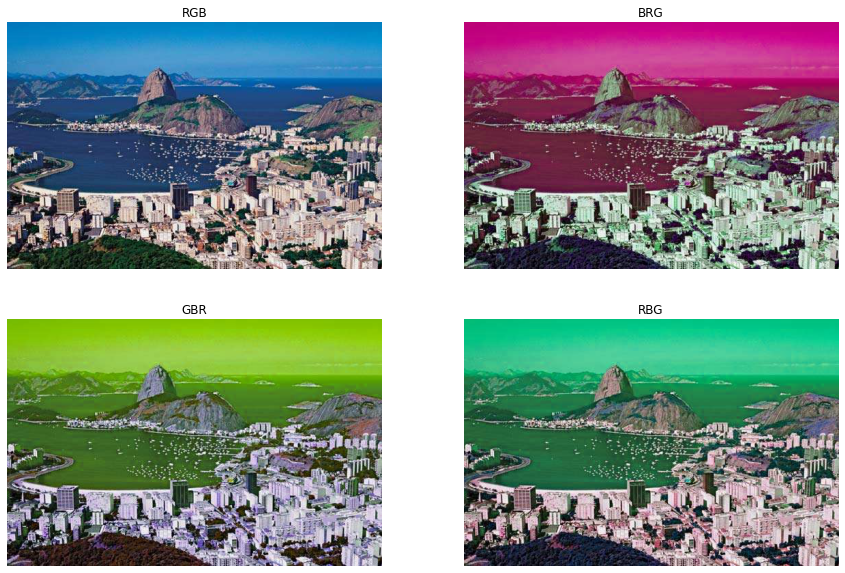

In [103]:
# Reconstrução correta (RGB)
img_rec_RGB = np.stack((img_ch0, img_ch1, img_ch2), axis=-1)

# Reconstrução correta (BRG)
img_rec_BRG = np.stack((img_ch2, img_ch0, img_ch1), axis=-1)

# Reconstrução correta (GBR)
img_rec_GBR = np.stack((img_ch1, img_ch2, img_ch0), axis=-1)

# Reconstrução correta (RBG)
img_rec_RBG = np.stack((img_ch0, img_ch2, img_ch1), axis=-1)

# Exibindo as imagens geradas
plt.figure(figsize=(15,10))
plt.subplot(2,2,1), plt.imshow(img_rec_RGB), plt.title('RGB'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(img_rec_BRG), plt.title('BRG'), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(img_rec_GBR), plt.title('GBR'), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(img_rec_RBG), plt.title('RBG'), plt.axis('off')
plt.show()

**(c)** Fazer o negativo de cada canal, $g(x,y) = 255-f(x,y)$, e empilhar as imagens resultantes.

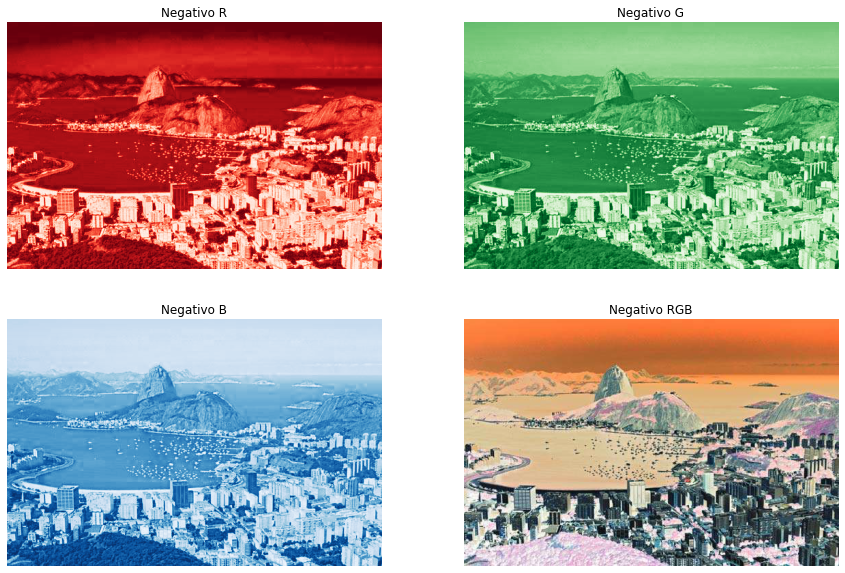

In [104]:
# Criando as imagens correspondentes ao negativo de cada canal
img_ch0_neg = 255-img_ch0
img_ch1_neg = 255-img_ch1
img_ch2_neg = 255-img_ch2

# Gerando a imagem a partir dos negativos
img_neg = np.stack((img_ch0_neg, img_ch1_neg, img_ch2_neg), axis=-1)

# Exibindo as imagens geradas
plt.figure(figsize=(15,10))
plt.subplot(2,2,1), plt.imshow(img_ch0_neg, cmap = 'Reds'), plt.title('Negativo R'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(img_ch1_neg, cmap = 'Greens'), plt.title('Negativo G'), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(img_ch2_neg, cmap = 'Blues'), plt.title('Negativo B'), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(img_neg), plt.title('Negativo RGB'), plt.axis('off')
plt.show()

## 5 - Histogramas

Histogramas são muito úteis para analisar os resultados dos tratamentos realizados nas imagens. Embora eles não tenham informação espacial, é possível quantificar o efeito de operações importantes como aumento de brilho e contraste da imagem.

**Exercício:**

**(a)** Transforme a matriz $N \times N$ correspondente a cada canal em um vetor com $N^2$ posições usando `np.flatten`.

In [105]:
# Transformando cada matriz em um vetor, com as linhas enfileiradas
img_ch0_flat = img_ch0.flatten()
img_ch1_flat = img_ch1.flatten()
img_ch2_flat = img_ch2.flatten()

# Exibindo as dimenões
print('Dimensões dos vetores obtidos pela aplicação do flatten():')
print('Canal 0: ', img_ch0_flat.shape)
print('Canal 1: ', img_ch1_flat.shape)
print('Canal 2: ', img_ch2_flat.shape)

Dimensões dos vetores obtidos pela aplicação do flatten():
Canal 0:  (199650,)
Canal 1:  (199650,)
Canal 2:  (199650,)


**(b)** Desenhe os histogramas de cada canal da imagem

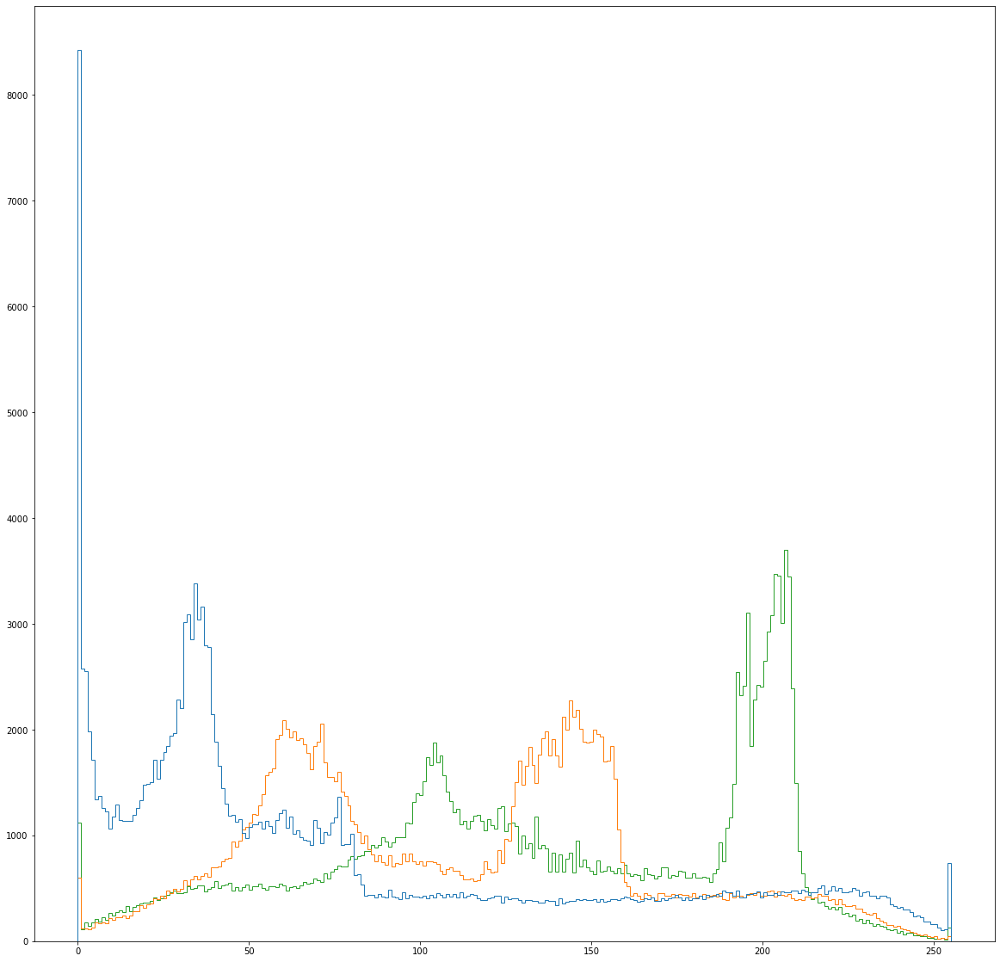

In [106]:
# Exibindo o histrograma de cada um dos canais em subplots
plt.figure(figsize=(20,20))

# plt.subplot(3,1,1), plt.hist(img_ch0_flat, bins=256), plt.title('Canal Vermelho')
# plt.subplot(3,1,2), plt.hist(img_ch1_flat, bins=256), plt.title('Canal Verde')
# plt.subplot(3,1,3), plt.hist(img_ch2_flat, bins=256), plt.title('Canal Azul')

plt.hist([img_ch0_flat, img_ch1_flat, img_ch2_flat], histtype='step', bins=256)

plt.show()

**(c)** Calcule média, desvio padrão e os seguintes percentis de cada canal: P25 (25% maiores) e P75 (75% maiores).

In [107]:
# Calculando e exibindo a média
media_ch0 = np.mean(img_ch0)
media_ch1 = np.mean(img_ch1)
media_ch2 = np.mean(img_ch2)
print(media_ch0)
print(media_ch1)
print(media_ch2)

81.30320060105184
112.03757575757575
136.03285249186075


In [108]:
# Calculando o valor de desvio padrão

# Quanto maior for o desvio padrão, maior vai ser o contraste
std_ch0 = np.std(img_ch0)
print(std_ch0)
std_ch1 = np.std(img_ch1)
print(std_ch1)
std_ch2 = np.std(img_ch2)
print(std_ch2)

72.01779568510082
54.68755109677171
60.12562962200941


In [109]:
# Calculando os percentis
# Útil para fazer alargamento de contraste

perc_ch0 = np.percentile(img_ch0, 10)
print(perc_ch0)
# 10% dos pixels dessa imagem estão abaixo da intensidade 7

perc_ch1 = np.percentile(img_ch1, 10)
print(perc_ch1)
# 10% dos pixels dessa imagem estão abaixo da intensidade 46

perc_ch2 = np.percentile(img_ch2, 10)
print(perc_ch2)
# 10% dos pixels dessa imagem estão abaixo da intensidade 49

7.0
46.0
49.0


## 6 - Brilho e Contraste

**Exercício:**

**(a)** Variar o brilho da imagem, multiplicando todos os pixels da imagem de 0.5 a 2.0

1.0


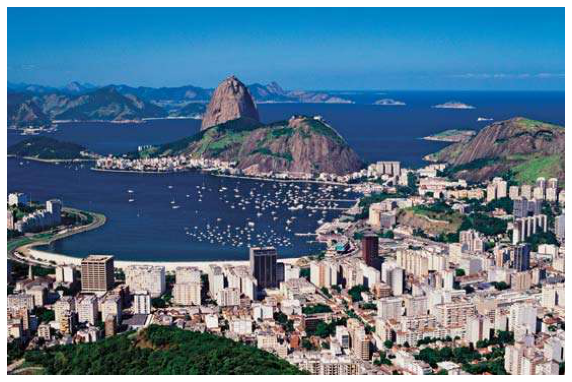

In [110]:
# Normalizando a imagem
img_norm = rio/255
print(np.amax(img_norm))

plt.figure(figsize=(10,10))
plt.imshow(img_norm)
plt.axis('off')
plt.show()

**(b)** Use a função `skimage.exposure.rescale_intensity` para re-escalar as intensidades da imagem em escala de cinza, usando como limites as intensidades correspondentes aos percentis P2 e P98.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


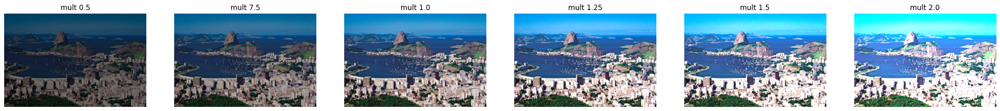

In [111]:
# Gerando as imagens com variação de brilho
img_brl_0p5 = img_norm * 0.5
img_brl_0p75 =  img_norm * 0.75
img_brl_1p0 = img_norm * 1.0
img_brl_1p25 = img_norm * 1.25
img_brl_1p5 = img_norm * 1.5
img_brl_2p0 = img_norm * 2.0

# Exibindo as imagens com variação de brilho
plt.figure(figsize = (30,10))
plt.subplot(1,6,1), plt.imshow(img_brl_0p5), plt.title('mult 0.5'), plt.axis('off')
plt.subplot(1,6,2), plt.imshow(img_brl_0p75), plt.title('mult 7.5'), plt.axis('off')
plt.subplot(1,6,3), plt.imshow(img_brl_1p0), plt.title('mult 1.0'), plt.axis('off')
plt.subplot(1,6,4), plt.imshow(img_brl_1p25), plt.title('mult 1.25'), plt.axis('off')
plt.subplot(1,6,5), plt.imshow(img_brl_1p5), plt.title('mult 1.5'), plt.axis('off')
plt.subplot(1,6,6), plt.imshow(img_brl_2p0), plt.title('mult 2.0'), plt.axis('off')
plt.show()

**(c)** Fazer o mesmo processo do item (b) para as imagens `moon` e `camera` da base de dados do Scikit-Image. Qual delas tem maior ganho de contraste com a operação?

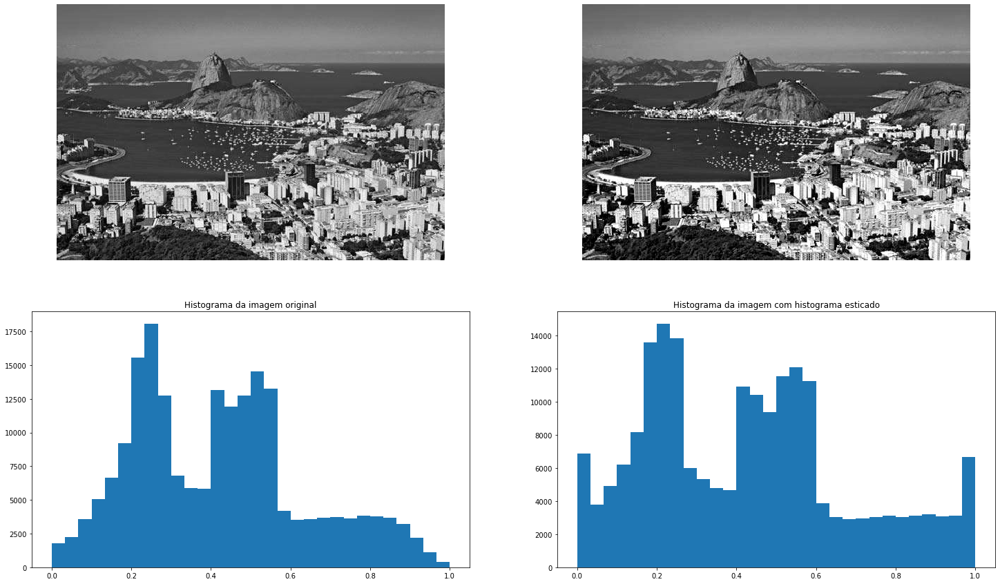

In [112]:
# Calculando os percentis limitantes inferior e superior
pinf = np.percentile(rio_gray, 2)
psup = np.percentile(rio_gray, 98)

# Re-escalando a intensidade da imagem, considerando os limites calculados
rio_gray_rescale = exposure.rescale_intensity(rio_gray, in_range=(pinf, psup))

# Exibindo a imagem gerada
plt.figure(figsize = (25,15))
plt.subplot(2,2,1), plt.imshow(rio_gray, cmap='gray', interpolation='nearest'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(rio_gray_rescale, cmap='gray', interpolation='nearest'), plt.axis('off')
plt.subplot(2,2,3), plt.hist(rio_gray.flatten(), bins = 30), plt.title('Histograma da imagem original')
plt.subplot(2,2,4), plt.hist(rio_gray_rescale.flatten(), bins = 30), plt.title('Histograma da imagem com histograma esticado')
plt.show()

**(d)** Use a função `skimage.exposure.equalize_hist` para equalizar os histogramas das imagem `moon` e `camera` da base de dados do Scikit-Image. Qual delas tem maior ganho de contraste com a operação?

(512, 512)


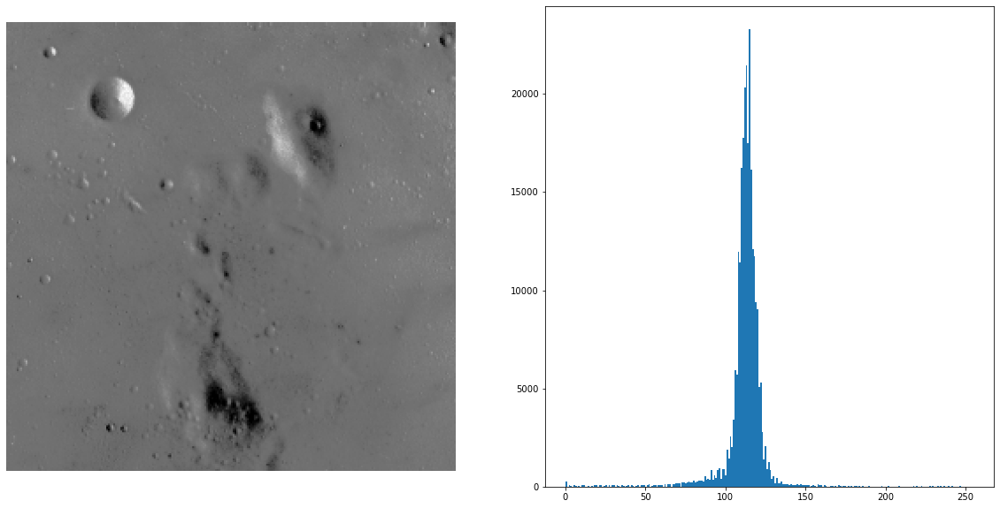

In [113]:
imgdata = data.moon()
print(imgdata.shape)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1), plt.imshow(imgdata, cmap='gray'), plt.axis('off')
plt.subplot(1,2,2), plt.hist(imgdata.flatten(), bins=256)
plt.show()

**(e)** Use a função `skimage.exposure.match_histogram` para fazer o pareamento de histograma das imagens `coffe` e `chelsea` da base de dados do Scikit-Image.

78.0 129.0


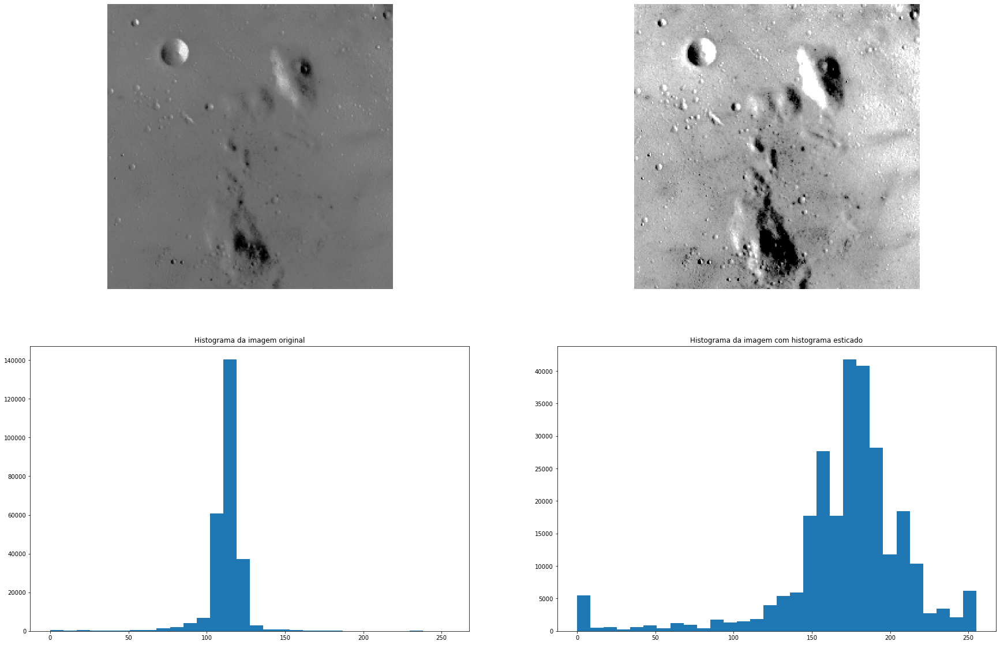

In [114]:
imgdata = data.moon()  # Usar data.moon() e data.camera()

# Fazer o mesmo procedimento anterior para a imgdata
pinf = np.percentile(imgdata, 2)
psup = np.percentile(imgdata, 98)
print(pinf, psup)

imgdata_rescale = exposure.rescale_intensity(imgdata, in_range=(pinf, psup))

plt.figure(figsize = (30,20))
plt.subplot(2,2,1), plt.imshow(imgdata, cmap='gray', interpolation='nearest'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(imgdata_rescale, cmap='gray', interpolation='nearest'), plt.axis('off')
plt.subplot(2,2,3), plt.hist(imgdata.flatten(), bins = 30), plt.title('Histograma da imagem original')
plt.subplot(2,2,4), plt.hist(imgdata_rescale.flatten(), bins = 30), plt.title('Histograma da imagem com histograma esticado')
plt.show()

## Exercícios

### Exercício 1

1 - Leia uma imagem colorida (de 3 canais) e a apresente numa figura.

2 - Separe os canais da imagem colorida e apresente numa mesma figura as imagens monocromáticas correspondentes (primeira linha) e os respectivos histogramas com bins de 0 a 255 (segunda linha).

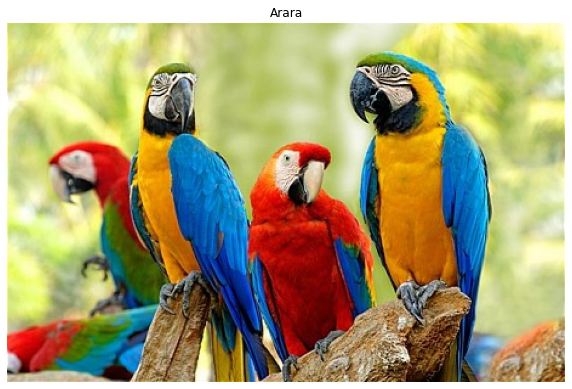

In [115]:
# Lendo e apresentando a imagem colorida
arara_img = io.imread('data/images/arara_full.png')

plt.figure(figsize=(10,10))
plt.imshow(arara_img)
plt.axis('off')
plt.title('Arara')
plt.show()

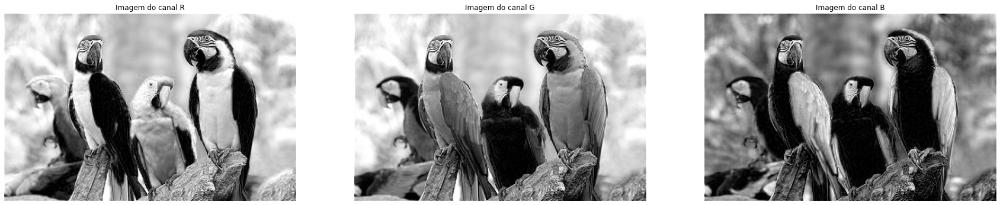

In [116]:
# Separando os canais e apresentando as imagens monocromáticas (de cada canal) e histogramas correspondentes
arara_img_chR = arara_img[:,:,0] # Matriz do vermelho R (primeiro canal)
arara_img_chG = arara_img[:,:,1] # Matriz do verde G (segundo canal)
arara_img_chB = arara_img[:,:,2] # Matriz do azul R (terceiro canal)

plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.imshow(arara_img_chR, cmap = 'gray'), plt.title('Imagem do canal R'), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(arara_img_chG, cmap = 'gray'), plt.title('Imagem do canal G'), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(arara_img_chB, cmap = 'gray'), plt.title('Imagem do canal B'), plt.axis('off')
plt.show()

### Exercício 2

1 - Para a imagem usada no exercício anterior, calcule o negativo de cada canal individualmente e apresente numa mesma figura as imagens monocromáticas correspondentes (primeira linha) e os respectivos histogramas com bins de 0 a 255 (segunda linha).

2 - Combine (concatene) as os negativos dos canais da imagem original numa imagem tricromática e apresente a imagem colorida original e a negativa em uma única figura.

*Dica: para concatenar imagens monocromáticas use a função "np.stack".*

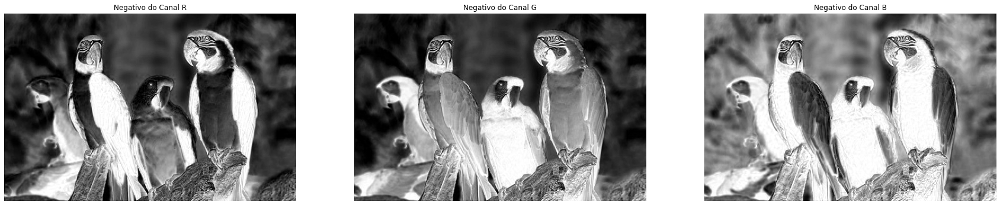

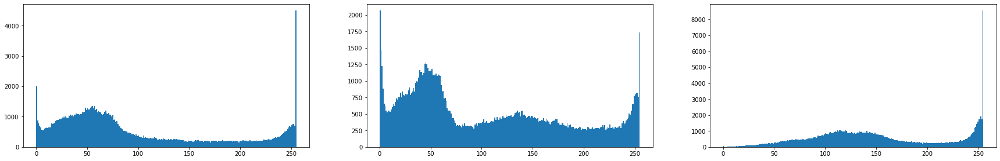

In [117]:
# Calculando os negativos dos canais e apresentando as imagens monocromáticas (de cada canal) e histogramas correspondentes
arara_img_chR_neg = 255-arara_img_chR
arara_img_chG_neg = 255-arara_img_chG
arara_img_chB_neg = 255-arara_img_chB

arara_img_chR_flat = arara_img_chR_neg.flatten()
arara_img_chG_flat = arara_img_chG_neg.flatten()
arara_img_chB_flat = arara_img_chB_neg.flatten()

plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.imshow(arara_img_chR_neg, cmap = 'gray'), plt.title('Negativo do Canal R'), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(arara_img_chG_neg, cmap = 'gray'), plt.title('Negativo do Canal G'), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(arara_img_chB_neg, cmap = 'gray'), plt.title('Negativo do Canal B'), plt.axis('off')
plt.show()

plt.figure(figsize=(30,10))
plt.subplot(2,3,1), plt.hist(arara_img_chR_flat, bins=256)
plt.subplot(2,3,2), plt.hist(arara_img_chG_flat, bins=256)
plt.subplot(2,3,3), plt.hist(arara_img_chB_flat, bins=256)
plt.show()

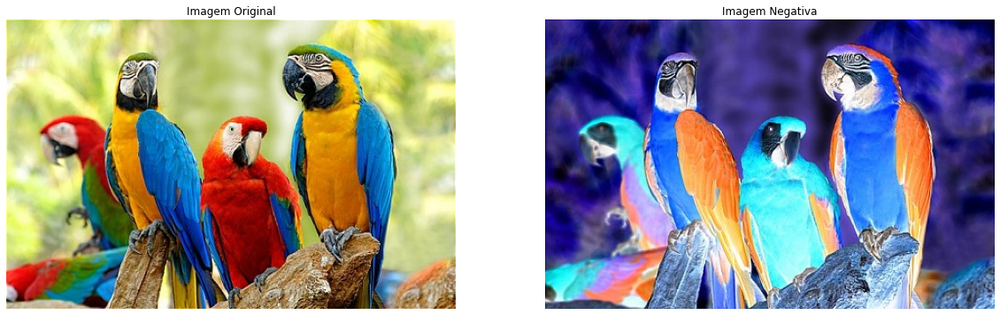

In [118]:
# Concatenando os negativos dos canais e apresentando a imagem colorida original e a negativa
arara_img_neg = np.stack((arara_img_chR_neg, arara_img_chG_neg, arara_img_chB_neg), axis=-1)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1), plt.imshow(arara_img), plt.title('Imagem Original'), plt.axis('off')
plt.subplot(1,2,2), plt.imshow(arara_img_neg), plt.title('Imagem Negativa'), plt.axis('off')
plt.show()

### Exercício 3

0 - Utilize a imagem colorida leme.bmp, presente no repositório GitHub indicado na Introdução.

1 - Separe os canais da imagem e realize uma cooreção Gama, de forma a clarear as áreas escuras, sem saturar muito as intensidades dos pixels da áreas claras da imagem.

2 - Apresente em uma mesma figura os canais da imagem original (primeira linha) e os respectivos histogramas (segunda linha).

3 - Apresente em uma mesma figura os canais corrigidos (primeira linha) e os respectivos histogramas (segunda linha).

4 - Apresente em uma mesma figura a imagem colorida original e a imagem colorida produzida através da concatenação dos canais corrigidos.

*Dicas: para fazer a correção Gama, use a função "exposure.adjust_gamma"; para concatenar imagens monocromáticas use a função "np.stack".*

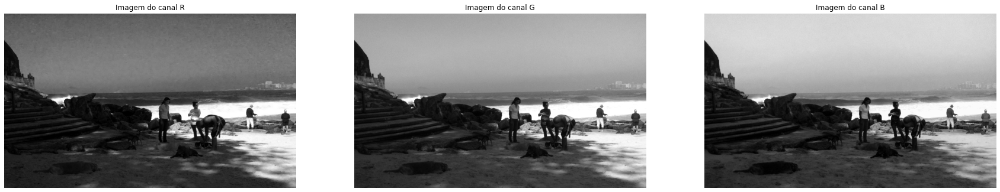

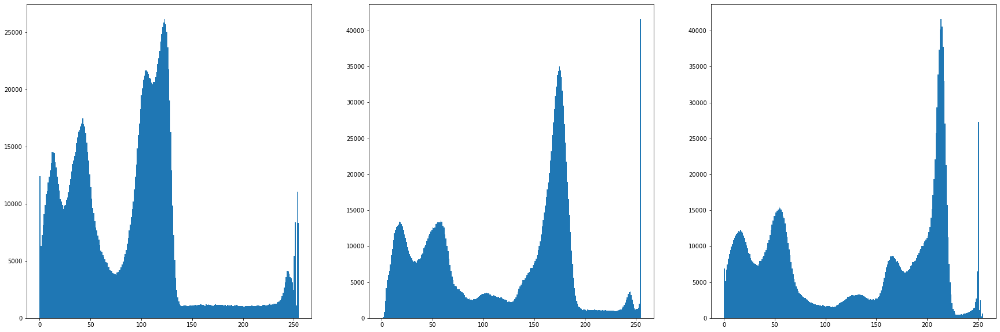

In [119]:
# Lendo a imagem e apresentando as imagens dos canais e respectivos histogramas
leme_img = io.imread('data/images/leme.bmp')

leme_img_chR = leme_img[:,:,0] # Matriz do vermelho R (primeiro canal)
leme_img_chG = leme_img[:,:,1] # Matriz do verde G (segundo canal)
leme_img_chB = leme_img[:,:,2] # Matriz do azul R (terceiro canal)

plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.imshow(leme_img_chR, cmap = 'gray'), plt.title('Imagem do canal R'), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(leme_img_chG, cmap = 'gray'), plt.title('Imagem do canal G'), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(leme_img_chB, cmap = 'gray'), plt.title('Imagem do canal B'), plt.axis('off')
plt.show()

leme_img_chR_flat = leme_img_chR.flatten()
leme_img_chG_flat = leme_img_chG.flatten()
leme_img_chB_flat = leme_img_chB.flatten()

plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.hist(leme_img_chR_flat, bins=256)
plt.subplot(1,3,2), plt.hist(leme_img_chG_flat, bins=256)
plt.subplot(1,3,3), plt.hist(leme_img_chB_flat, bins=256)
plt.show()

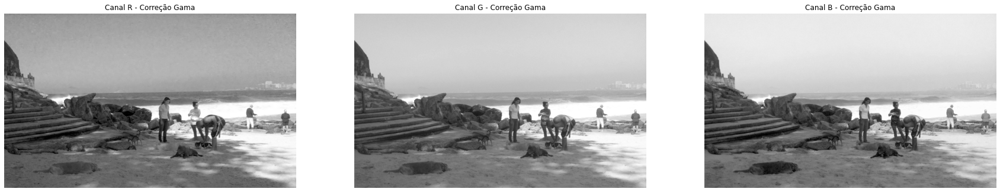

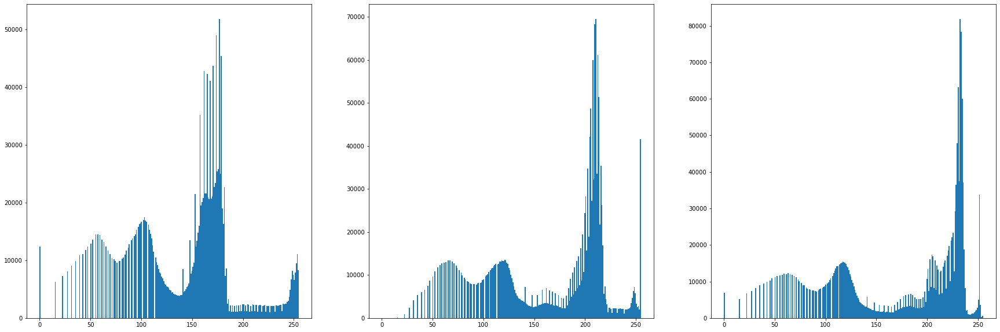

In [120]:
# Aplicando a correção Gama sobre os canais e apresentando as imagens dos canais corrigidos e respectivos histogramas
leme_img_chR_gama = exposure.adjust_gamma(leme_img_chR, 0.5)
leme_img_chG_gama = exposure.adjust_gamma(leme_img_chG, 0.5)
leme_img_chB_gama = exposure.adjust_gamma(leme_img_chB, 0.5)

plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.imshow(leme_img_chR_gama, cmap = 'gray'), plt.title('Canal R - Correção Gama'), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(leme_img_chG_gama, cmap = 'gray'), plt.title('Canal G - Correção Gama'), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(leme_img_chB_gama, cmap = 'gray'), plt.title('Canal B - Correção Gama'), plt.axis('off')
plt.show()

leme_img_chR_gama_flat = leme_img_chR_gama.flatten()
leme_img_chG_gama_flat = leme_img_chG_gama.flatten()
leme_img_chB_gama_flat = leme_img_chB_gama.flatten()

plt.figure(figsize=(30,10))
plt.subplot(1,3,1), plt.hist(leme_img_chR_gama_flat, bins=256)
plt.subplot(1,3,2), plt.hist(leme_img_chG_gama_flat, bins=256)
plt.subplot(1,3,3), plt.hist(leme_img_chB_gama_flat, bins=256)
plt.show()

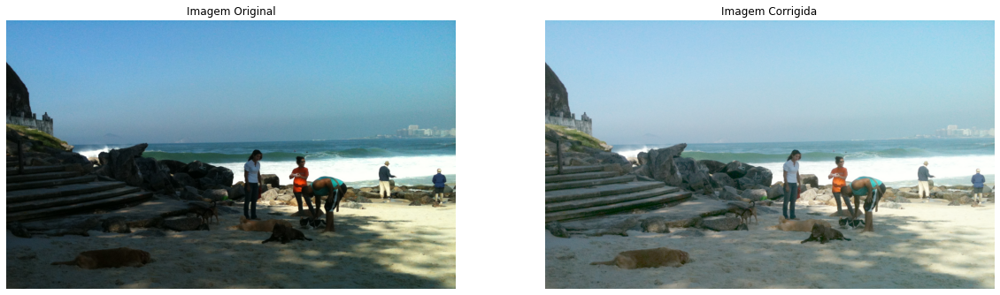

In [121]:
# Concatenando os negativos dos canais e apresentando a imagem colorida original e a negativa
leme_img_gama = np.stack((leme_img_chR_gama, leme_img_chG_gama, leme_img_chB_gama), axis=-1)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1), plt.imshow(leme_img), plt.title('Imagem Original'), plt.axis('off')
plt.subplot(1,2,2), plt.imshow(leme_img_gama), plt.title('Imagem Corrigida'), plt.axis('off')
plt.show()

### Exercício 4

0 - Utilize as imagens "moon" e "camera" do módulo "data" do Skimage e realize os procedimentos listados abaixo para rada uma delas.

1 - Realize o alargamento de contraste das imagens: saturando os pixels com
intensidades inferiores àquela que corresponde ao limite (percentil) de 2% (dos
pixels com intensidade mais baixa); e saturando os pixels com intensidades
superiores àquela que corresponde ao limite (percentil) de 98% (dos pixels com
intensidade mais alta).

2 - Realize a equalização de histograma das imagens.

3 - Apresente numa única figura para cada imagem: a imagem original e as imagens transformadas nos itens 1 e 2 (primeira linha); e os respectivos histogramas (segunda linha). 

*Dicas: para calcular os percentis, use a função "np.percentile"; para fazer o alargamento de contraste, use a função "exposure.rescale_intensity"; para fazer a equalização de histogramas, use a função "exposure.equalize_hist".*

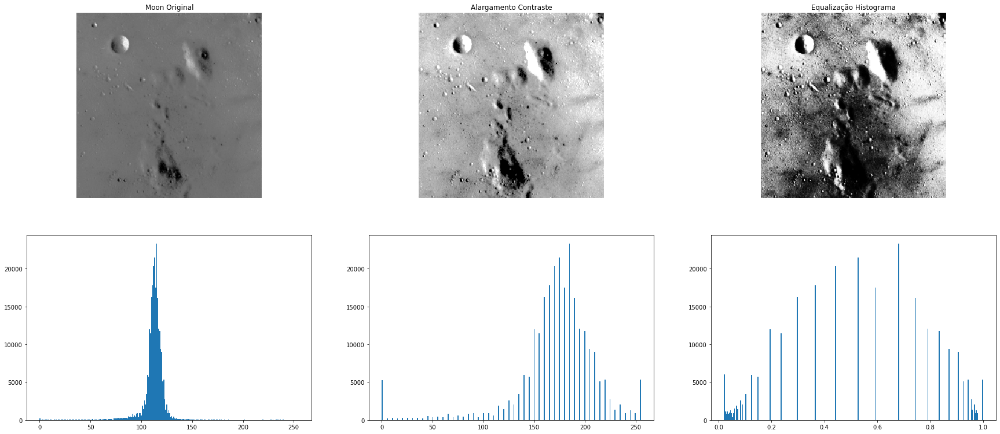

In [122]:
# Lendo a imagem 'moon', realizando o alargamento de contraste a equalização dos histogramas, e apresentando os histogramas
moon_img = data.moon()
moon_img_rescale = exposure.rescale_intensity(moon_img, in_range=(np.percentile(moon_img, 2), np.percentile(moon_img, 98)))
moon_img_equalize_hist = exposure.equalize_hist(moon_img_rescale)

plt.figure(figsize = (30,20))
plt.subplot(3,3,1), plt.imshow(moon_img, cmap='gray', interpolation='nearest'), plt.title('Moon Original'), plt.axis('off')
plt.subplot(3,3,2), plt.imshow(moon_img_rescale, cmap='gray', interpolation='nearest'), plt.title('Alargamento Contraste'), plt.axis('off')
plt.subplot(3,3,3), plt.imshow(moon_img_equalize_hist, cmap='gray', interpolation='nearest'), plt.title('Equalização Histograma'), plt.axis('off')
plt.subplot(3,3,4), plt.hist(moon_img.flatten(), bins=256)
plt.subplot(3,3,5), plt.hist(moon_img_rescale.flatten(), bins=256)
plt.subplot(3,3,6), plt.hist(moon_img_equalize_hist.flatten(), bins=256)
plt.show()

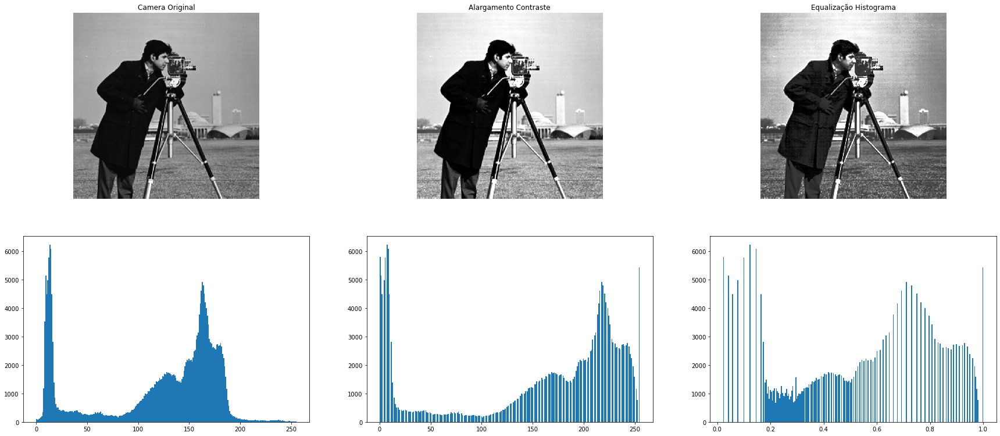

In [123]:
# Lendo a imagem 'camera', realizando o alargamento de contraste a equalização dos histogramas, e apresentando os histogramas
camera_img = data.camera()
camera_img_rescale = exposure.rescale_intensity(camera_img, in_range=(np.percentile(camera_img, 2), np.percentile(camera_img, 98)))
camera_img_equalize_hist = exposure.equalize_hist(camera_img_rescale)

plt.figure(figsize = (30,20))
plt.subplot(3,3,1), plt.imshow(camera_img, cmap='gray', interpolation='nearest'), plt.title('Camera Original'), plt.axis('off')
plt.subplot(3,3,2), plt.imshow(camera_img_rescale, cmap='gray', interpolation='nearest'), plt.title('Alargamento Contraste'), plt.axis('off')
plt.subplot(3,3,3), plt.imshow(camera_img_equalize_hist, cmap='gray', interpolation='nearest'), plt.title('Equalização Histograma'), plt.axis('off')
plt.subplot(3,3,4), plt.hist(camera_img.flatten(), bins=256)
plt.subplot(3,3,5), plt.hist(camera_img_rescale.flatten(), bins=256)
plt.subplot(3,3,6), plt.hist(camera_img_equalize_hist.flatten(), bins=256)
plt.show()

### Exercício 5

0 - Selecione duas imagens coloridas quaisquer (do repositório GitHub ou do seu Google Drive). Para este exercício é interessante que as imagens apresentem gamutes consideravelmente distintos.

1 - Realiza o pareamento de histograma entre as duas imagens: faça com que a primeira imagem tenha um histograma parecido com o da segunda, e vice-versa.

2 - Apresente em uma mesma figura as imagens coloridas originais (primeira linha) e as imagens transformadas (segunda linha).

*Dica: para fazer o pareamento de histogramas, use a função "exposure.match_histograms".*

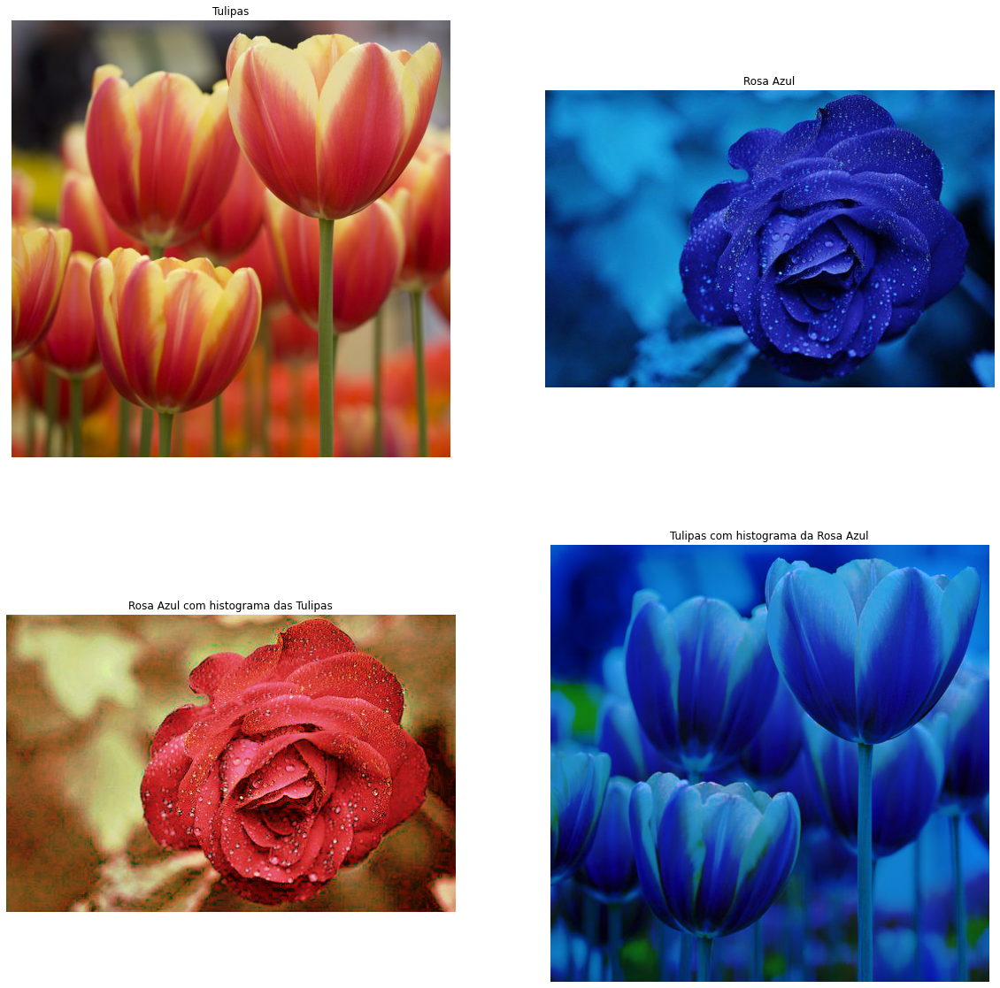

In [124]:
# Lendo as imagens, pareando histogramas e apresentando as imagens originais e com histogramas pareados
rosa_azul_img = io.imread('data/images/rosa_azul.jpg')
tulipas_img = io.imread('data/images/tulipas.jpg')

plt.figure(figsize = (20,20))
plt.subplot(2,2,1), plt.imshow(tulipas_img), plt.title('Tulipas'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(rosa_azul_img), plt.title('Rosa Azul'), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(exposure.match_histograms(rosa_azul_img, tulipas_img, multichannel=True)), plt.title('Rosa Azul com histograma das Tulipas'), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(exposure.match_histograms(tulipas_img, rosa_azul_img, multichannel=True)), plt.title('Tulipas com histograma da Rosa Azul'), plt.axis('off')
plt.show()

### Exercício 6

0 - Selecione uma imagem monocromática qualquer. Observe que certas imagens monocromáticas, e.g., em formato PNG possuem três canas com intensidades idênticas. Neste caso deve-se extrair um dos canais para realizar o exercicio.

1 - Acrescente à imagem original ruído sal-e-pimenta, e apresente a imagem original e a imagem ruidosa em uma única figura.

2 - A aplique à imagem ruidosa os seguntes filtros: média; gaussiano; e mediana, e apresente numa mesma figura as imagens filtradas.

*Dicas: para introduzir ruído numa imagem, use a função "util.random_noise"; para fazer a filtragem com um filtro de média, use a função "ndimage.convolve"; para fazer a filtragem com um filtro Gaussiano, use a função "filters.gaussian"; para fazer a filtragem com um filtro de mediana, use a função "filters.rank.median".*

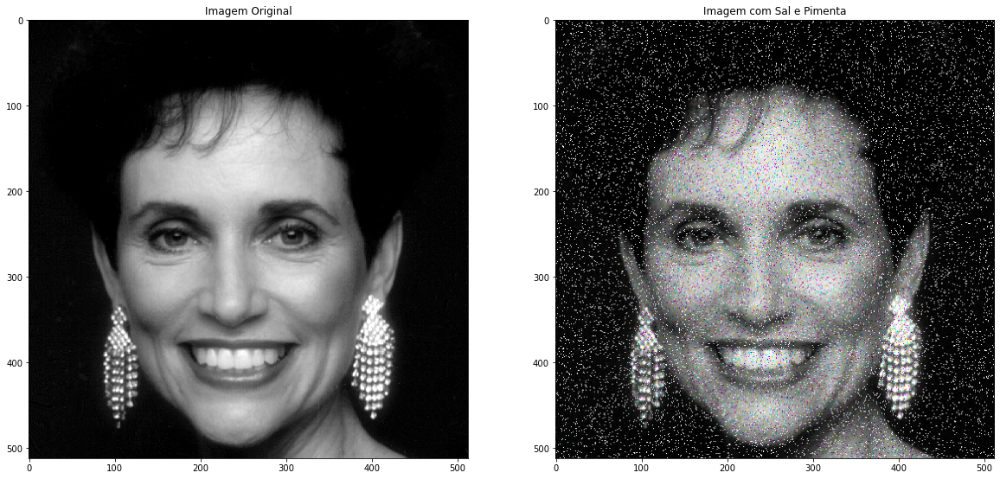

In [125]:
# Lendo a imagem e acrescentando ruído, e mostrando as duas imagens
woman_img = io.imread('data/images/woman.png')

woman_img_noise = util.random_noise(woman_img, 'salt')
woman_img_noise = util.random_noise(woman_img, 'pepper')
# woman_img_noise_media = ndimage.convolve(woman_img_noise)

plt.figure(figsize = (20,20))
plt.subplot(1,2,1), plt.imshow(woman_img), plt.title('Imagem Original')
plt.subplot(1,2,2), plt.imshow(woman_img_noise), plt.title('Imagem com Sal e Pimenta')
plt.show()

In [128]:
# Aplicando filtros e mostrando as imagens resultantes
# woman_img_noise_media = ndimage.convolve(woman_img_noise)
woman_img_noise_gaussiano = filters.gaussian(woman_img_noise)
woman_img_noise_mediana = filters.rank.median(woman_img_noise)


plt.figure(figsize = (30,20))
plt.subplot(1,3,1), plt.imshow(woman_img_noise), plt.title('Filtro Média'), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(woman_img_noise_gaussiano), plt.title('Filtro Gaussiano'), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(woman_img_noise_mediana), plt.title('Filtro Mediana'), plt.axis('off')
plt.show()

ValueError: The parameter `image` must be a 2-dimensional array

### Exercício 7

0 - Selecione uma imagem colorida qualquer e transforme-a em uma imagem monocromática.

1 - Calcule a magnitude e o ângulo do gradiente da imagem monocromática utilizando os filtros de Sobel vertical e horizontal.

3 - Apresente numa mesma figura a imagem original (colorida), a imagem monocromática, a imagem da amplitude do gradiente, e a imagem do ângulo do gradiente.

*Dicas: para fazer a filtragem com um filtro de derivação, use a função "ndimage.convolve"; para calcular amplitudes e ângulos do gradiente, use as funções "np.sqrt", "np.square", e "np.arctan2".*

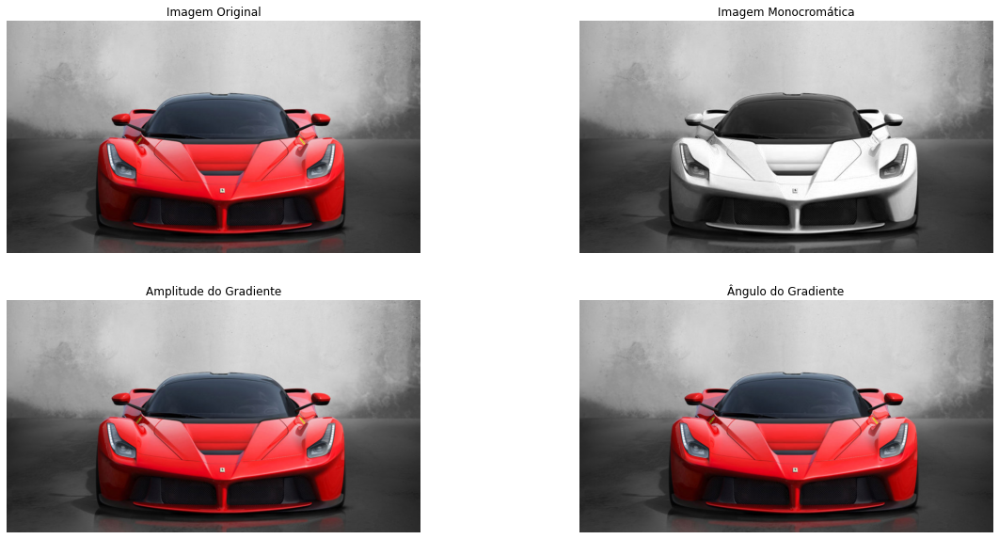

In [129]:
# Lendo a imagem e transformando em monocromática, calculando gradiente e apresentando as imagens: original; monocromática; amplitude do gradiente; ângulo do gradiente
ferrari_img = io.imread('data/images/Ferrari.jpg')

ferrari_img_chR = ferrari_img[:,:,0] # Matriz do vermelho R (primeiro canal)

ferrari_img_monocromatica = np.stack((ferrari_img_chR, ferrari_img_chR, ferrari_img_chR), axis=-1)

plt.figure(figsize = (20,10))
plt.subplot(2,2,1), plt.imshow(ferrari_img), plt.title('Imagem Original'), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(ferrari_img_monocromatica), plt.title('Imagem Monocromática'), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(ferrari_img), plt.title('Amplitude do Gradiente'), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(ferrari_img), plt.title('Ângulo do Gradiente'), plt.axis('off')
plt.show()